<a href="https://colab.research.google.com/github/Lokeshwaran2975/CODSOFT_ML_PROJECTS/blob/main/MOVIE_GENRE_CLASSIFICATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

In [ ]:
train_df = pd.read_csv("train_data.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'], engine='python')
test_df = pd.read_csv("test_data.txt", sep=':::', names=['ID', 'TITLE', 'DESCRIPTION'], engine='python')
test_solution_df = pd.read_csv("test_data_solution.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'], engine='python')

In [ ]:
print("shape",train_df.shape)
display(train_df.head())

shape (54214, 4)


,ID,TITLE,GENRE,DESCRIPTION
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [ ]:
print("shape",test_solution_df.shape)
display(test_solution_df.head())

shape (54200, 4)


,ID,TITLE,GENRE,DESCRIPTION
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


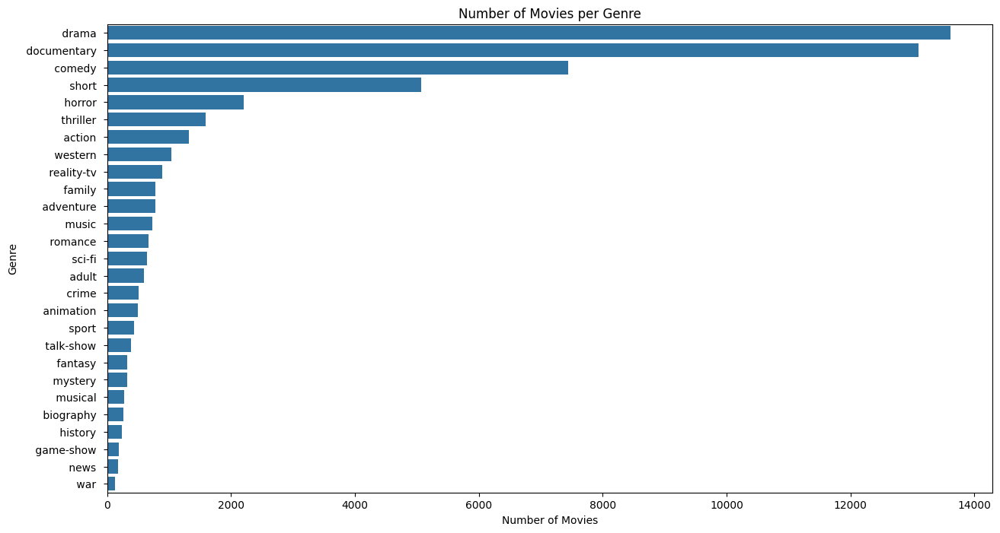

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(15, 8))
sns.countplot(y=train_df['GENRE'], order=train_df['GENRE'].value_counts().index)
plt.title('Number of Movies per Genre')
plt.xlabel('Number of Movies')
plt.ylabel('Genre')
plt.show()

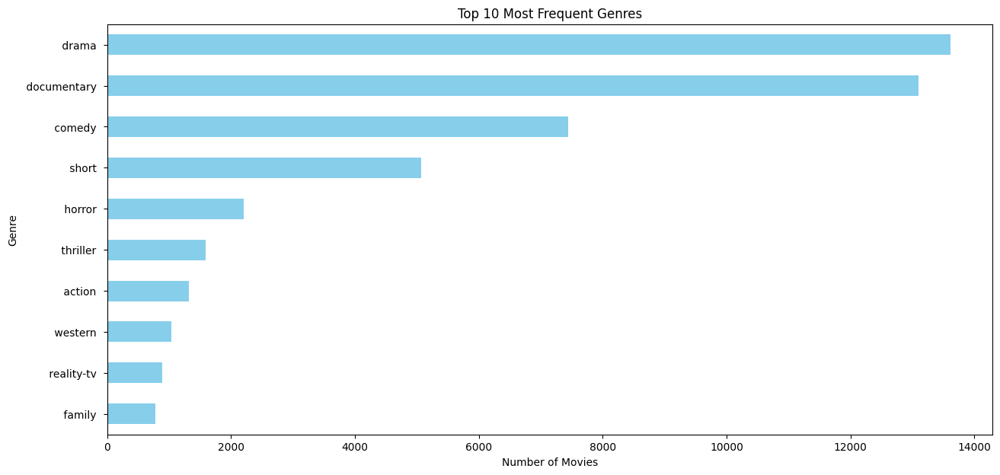

In [ ]:
top_genres = train_df['GENRE'].value_counts().head(10)
plt.figure(figsize=(15, 7))
top_genres.plot(kind='barh', color='skyblue')
plt.title('Top 10 Most Frequent Genres')
plt.xlabel('Number of Movies')
plt.ylabel('Genre')
plt.gca().invert_yaxis()
plt.show()

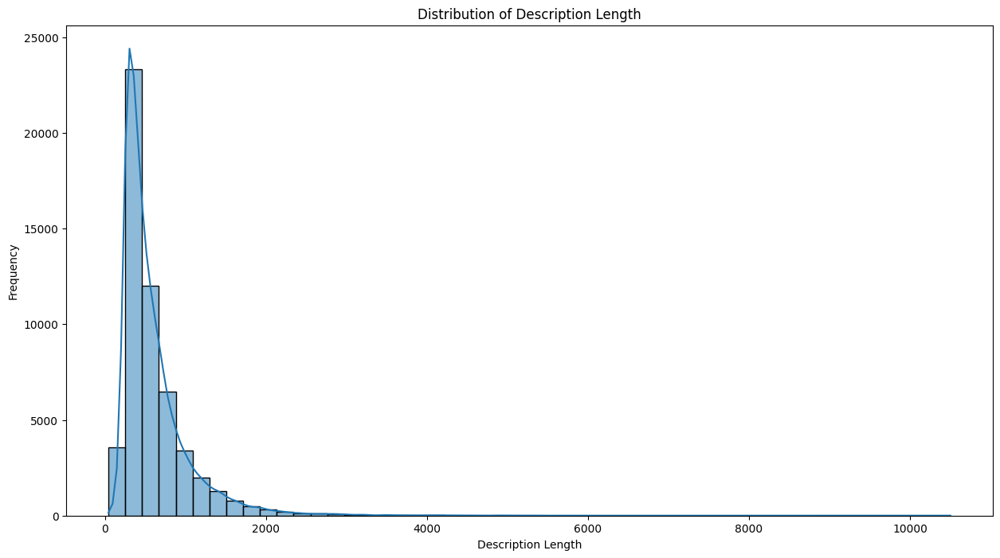

In [ ]:
train_df['description_length'] = train_df['DESCRIPTION'].apply(len)
plt.figure(figsize=(15, 8))
sns.histplot(train_df['description_length'], bins=50, kde=True)
plt.title('Distribution of Description Length')
plt.xlabel('Description Length')
plt.ylabel('Frequency')
plt.show()

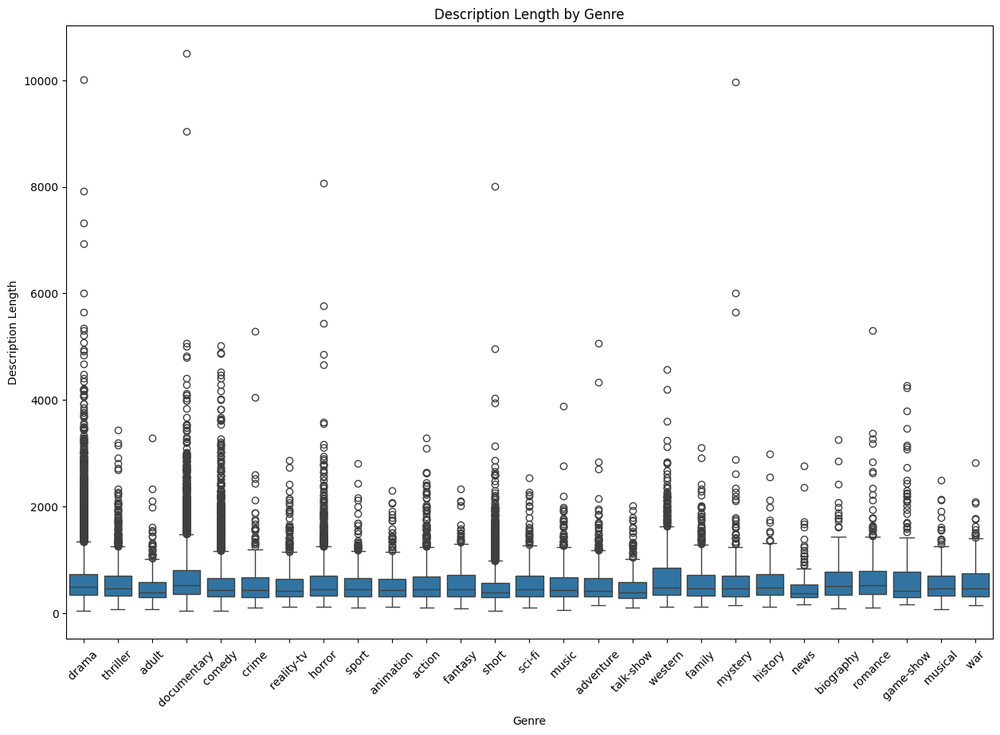

In [ ]:
plt.figure(figsize=(15, 10))
sns.boxplot(x='GENRE', y='description_length', data=train_df)
plt.title('Description Length by Genre')
plt.xticks(rotation=45)
plt.xlabel('Genre')
plt.ylabel('Description Length')
plt.show()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


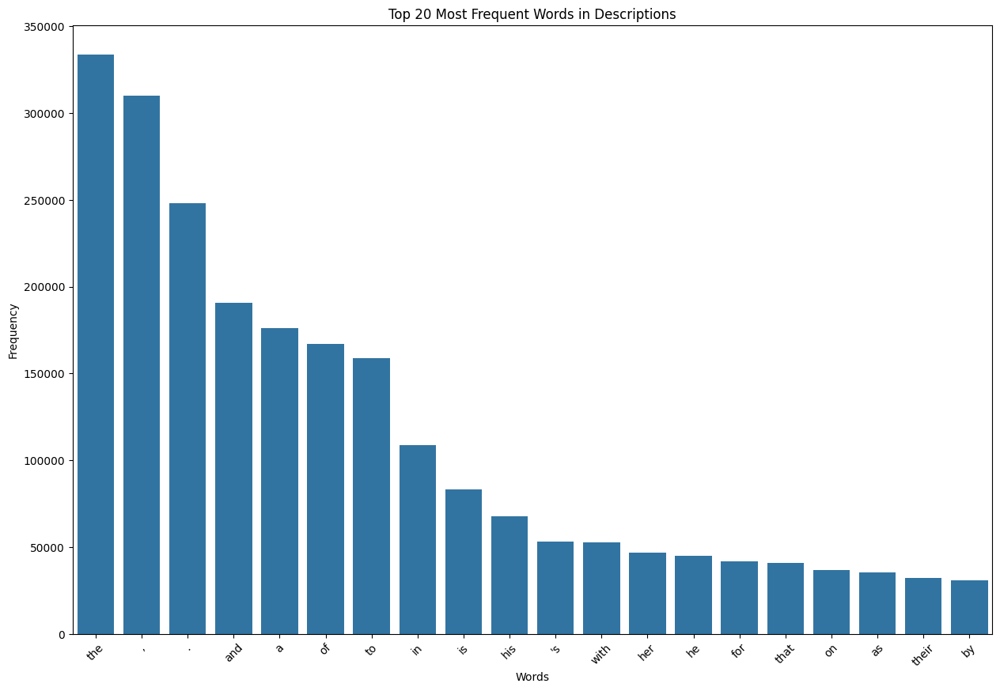

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')
words = ' '.join(train_df['DESCRIPTION']).lower()
tokenized_words = word_tokenize(words)
word_freq = Counter(tokenized_words)
top_words = word_freq.most_common(20)
top_words_words = [word[0] for word in top_words]
top_words_freq = [word[1] for word in top_words]
plt.figure(figsize=(15, 10))
sns.barplot(x=top_words_words, y=top_words_freq)
plt.xticks(rotation=45)
plt.title('Top 20 Most Frequent Words in Descriptions')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.show()

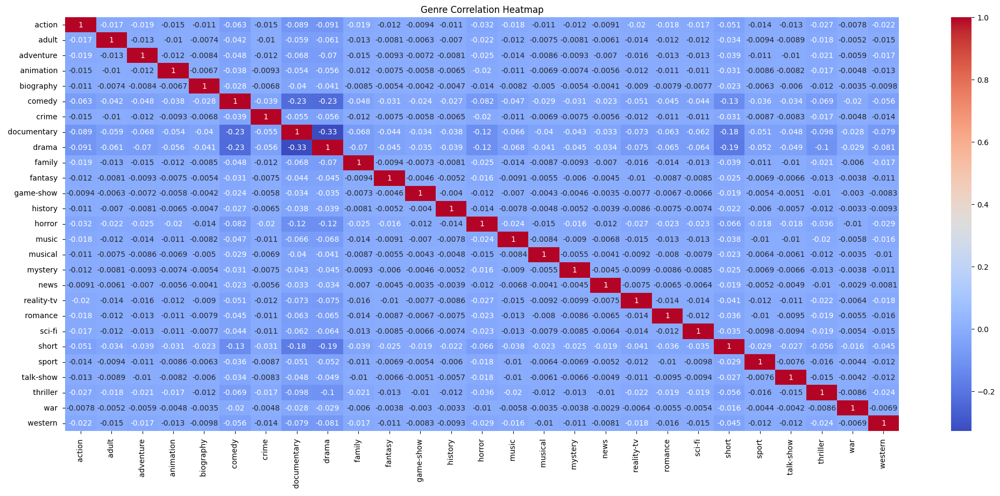

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer
train_df['GENRE_list'] = train_df['GENRE'].str.split(',')
mlb = MultiLabelBinarizer()
genres_binarized = pd.DataFrame(mlb.fit_transform(train_df['GENRE_list']), columns=mlb.classes_)
correlation = genres_binarized.corr()
plt.figure(figsize=(25, 10))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Genre Correlation Heatmap')
plt.show()

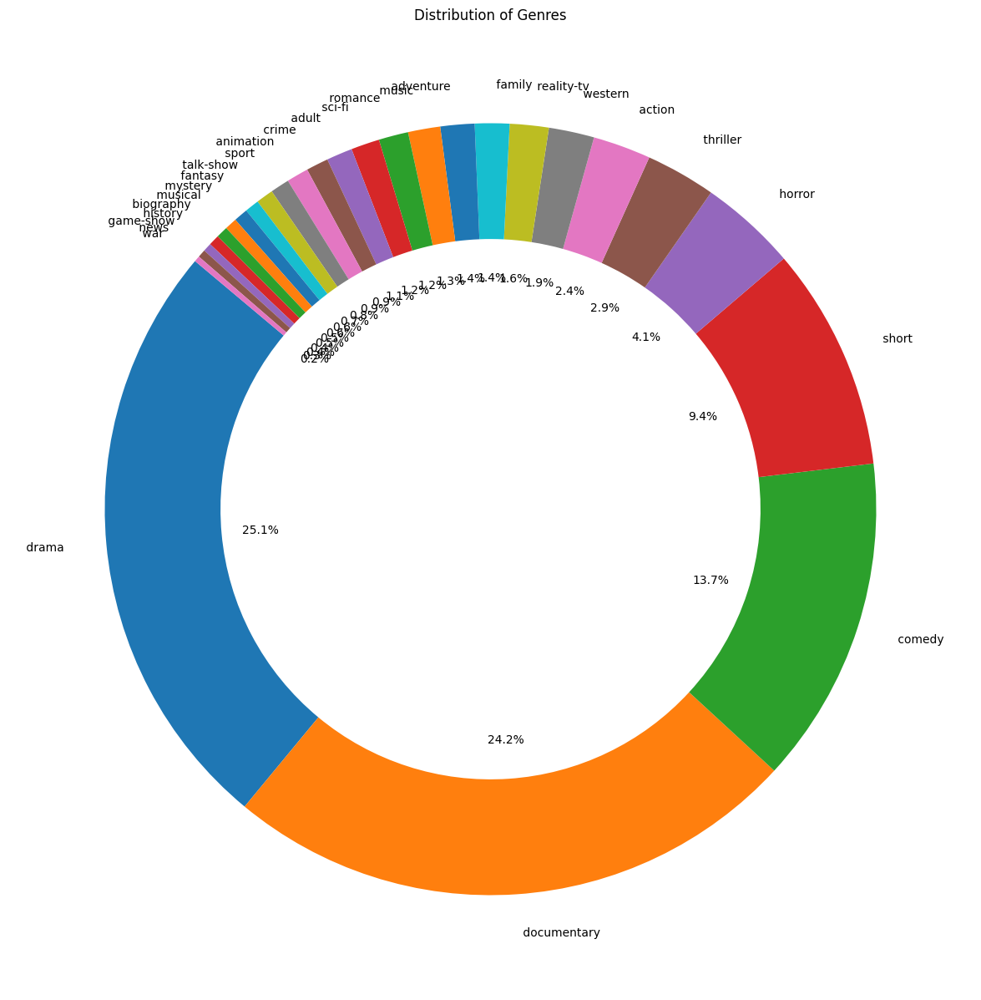

In [ ]:
genre_counts = train_df['GENRE'].value_counts()
plt.figure(figsize=(20, 15))
plt.pie(genre_counts, labels=genre_counts.index, startangle=140, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Distribution of Genres')
plt.show()

In [ ]:
pip install textblob

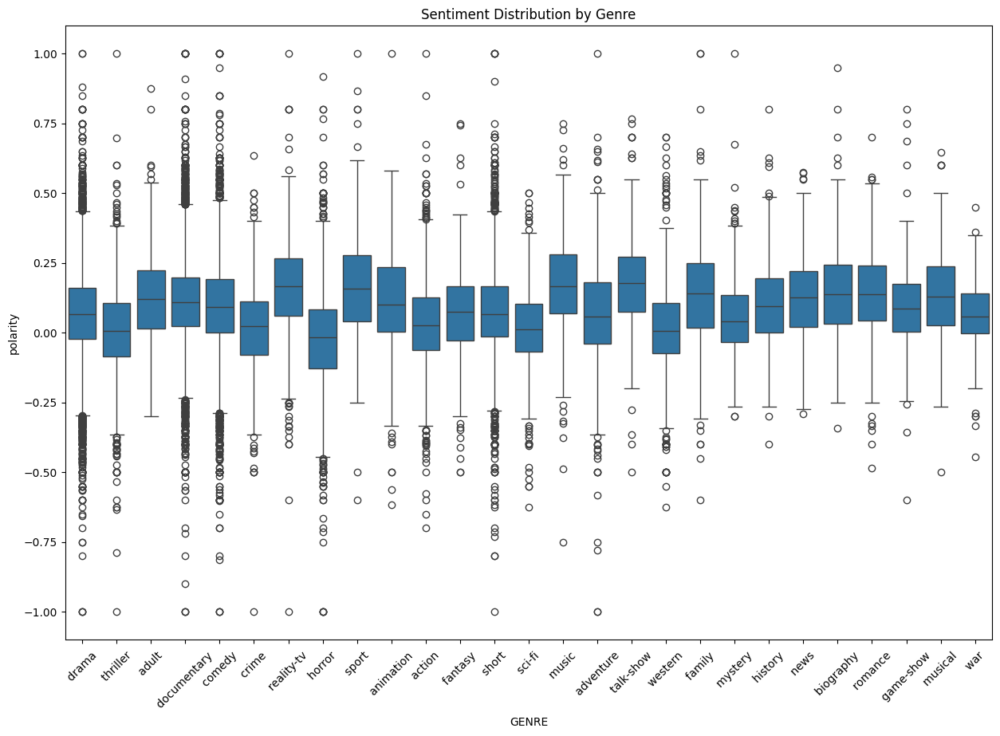

In [ ]:
from textblob import TextBlob
train_df['polarity'] = train_df['DESCRIPTION'].apply(lambda x: TextBlob(x).sentiment.polarity)
plt.figure(figsize=(15,10))
sns.boxplot(data=train_df, x='GENRE', y='polarity')
plt.xticks(rotation=45)
plt.title('Sentiment Distribution by Genre')
plt.show()

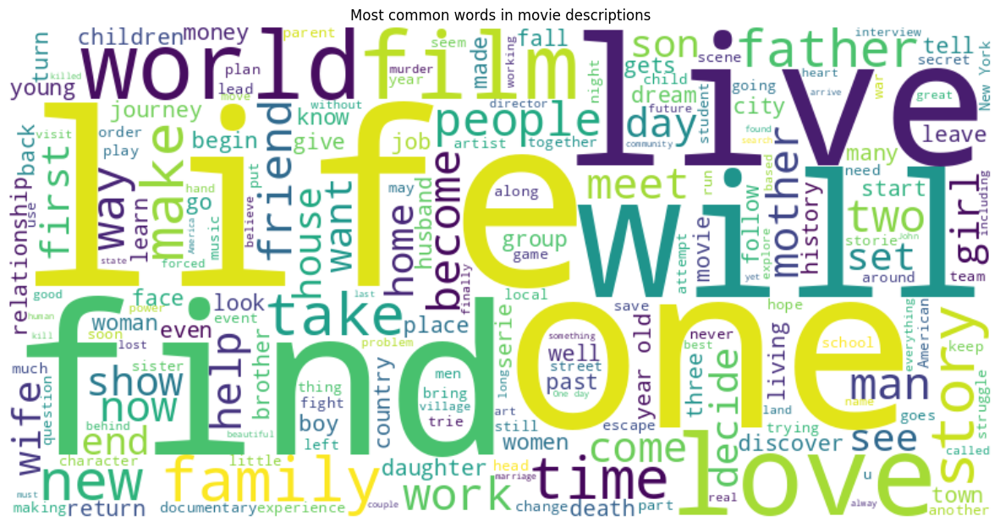

In [ ]:
from wordcloud import WordCloud
text = ' '.join(description for description in train_df['DESCRIPTION'])
wordcloud = WordCloud(background_color="white", width=800, height=400).generate(text)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most common words in movie descriptions')
plt.show()


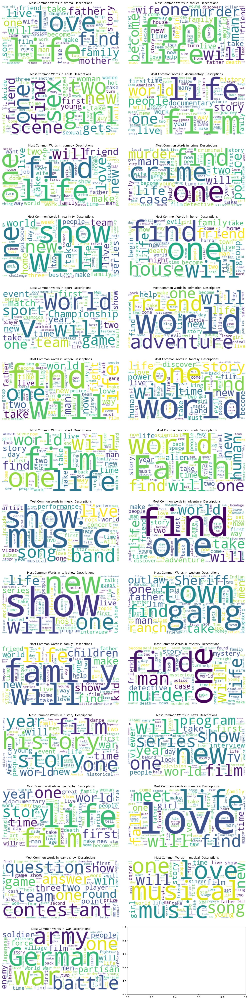

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
genres = train_df['GENRE'].unique()
n_rows = 14
n_cols = 2
fig, ax = plt.subplots(n_rows, n_cols, figsize=(15, 60))
for i, genre in enumerate(genres, start=1):
    plt.subplot(n_rows, n_cols, i)
    genre_text = ' '.join(description for description in train_df[train_df['GENRE'] == genre]['DESCRIPTION'])
    wordcloud = WordCloud(background_color="white", width=400, height=200, max_words=100).generate(genre_text)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Most Common Words in {genre} Descriptions')
plt.tight_layout()
plt.show()


In [ ]:
pip install --upgrade scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 41.7 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2


In [ ]:
import sklearn
print(sklearn.__version__)

1.3.2


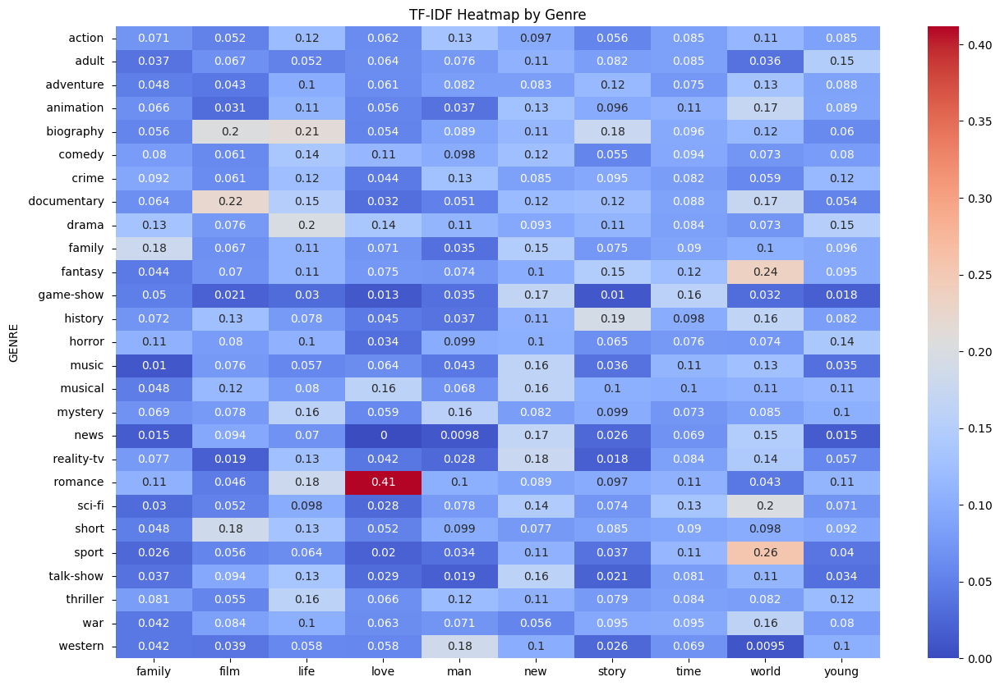

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(max_df=0.85, max_features=10, stop_words='english')
tfidf_matrix = tfidf.fit_transform(train_df['DESCRIPTION'])
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())
genre_tfidf = train_df[['GENRE']].join(tfidf_df)
plt.figure(figsize=(15,10))
sns.heatmap(genre_tfidf.groupby('GENRE').mean(),annot=True, cmap='coolwarm')
plt.title('TF-IDF Heatmap by Genre')
plt.show()

In [ ]:
train_df['DESCRIPTION'].fillna("", inplace=True)
test_df['DESCRIPTION'].fillna("", inplace=True)
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=10000)
X_train = tfidf_vectorizer.fit_transform(train_df['DESCRIPTION'])
X_test = tfidf_vectorizer.transform(test_df['DESCRIPTION'])
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(train_df['GENRE'])
y_test = label_encoder.transform(test_solution_df['GENRE'])

In [ ]:
X_train_sub, X_val, y_train_sub, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
clf = LinearSVC()
clf.fit(X_train_sub, y_train_sub)
y_val_pred = clf.predict(X_val)
print("Validation Accuracy:", accuracy_score(y_val, y_val_pred))
print("Validation Classification Report:\n", classification_report(y_val, y_val_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  class LinearSVC(LinearClassifierMixin, SparseCoefMixin, BaseEstimator):


Validation Accuracy: 0.5662639490915798
Validation Classification Report:
               precision    recall  f1-score   support

           0       0.43      0.34      0.38       263
           1       0.68      0.45      0.54       112
           2       0.38      0.24      0.29       139
           3       0.37      0.17      0.24       104
           4       0.00      0.00      0.00        61
           5       0.51      0.56      0.53      1443
           6       0.23      0.07      0.11       107
           7       0.69      0.80      0.74      2659
           8       0.56      0.69      0.62      2697
           9       0.30      0.15      0.20       150
          10       0.12      0.03      0.04        74
          11       0.77      0.68      0.72        40
          12       0.00      0.00      0.00        45
          13       0.62      0.64      0.63       431
          14       0.55      0.53      0.54       144
          15       0.12      0.02      0.03        50
      

In [ ]:
y_pred = clf.predict(X_test)
print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("Test Classification Report:\n", classification_report(y_test, y_pred))

Test Accuracy: 0.5662361623616237
Test Classification Report:
               precision    recall  f1-score   support

           0       0.39      0.31      0.35      1314
           1       0.58      0.37      0.45       590
           2       0.40      0.22      0.29       775
           3       0.34      0.14      0.20       498
           4       0.00      0.00      0.00       264
           5       0.52      0.57      0.55      7446
           6       0.26      0.08      0.12       505
           7       0.69      0.80      0.74     13096
           8       0.56      0.69      0.62     13612
           9       0.30      0.15      0.20       783
          10       0.23      0.06      0.10       322
          11       0.77      0.60      0.67       193
          12       0.12      0.01      0.02       243
          13       0.60      0.61      0.60      2204
          14       0.59      0.49      0.54       731
          15       0.26      0.07      0.11       276
          16      

In [ ]:
from sklearn.naive_bayes import MultinomialNB
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

MultinomialNB()

In [ ]:
from sklearn.linear_model import LogisticRegression
lr_classifier = LogisticRegression(max_iter=1000)
lr_classifier.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report
y_pred_nb = nb_classifier.predict(X_test)
print("Naive Bayes Accuracy:", accuracy_score(y_test, y_pred_nb))
print(classification_report(y_test, y_pred_nb))
y_pred_lr = lr_classifier.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_lr))
print(classification_report(y_test, y_pred_lr))

Naive Bayes Accuracy: 0.5215682656826568
              precision    recall  f1-score   support

           0       0.58      0.06      0.11      1314
           1       0.54      0.05      0.10       590
           2       0.81      0.07      0.13       775
           3       0.00      0.00      0.00       498
           4       0.00      0.00      0.00       264
           5       0.53      0.43      0.48      7446
           6       0.00      0.00      0.00       505
           7       0.57      0.88      0.69     13096
           8       0.46      0.84      0.59     13612
           9       0.00      0.00      0.00       783
          10       0.00      0.00      0.00       322
          11       0.97      0.19      0.31       193
          12       0.00      0.00      0.00       243
          13       0.73      0.31      0.43      2204
          14       0.95      0.05      0.10       731
          15       0.00      0.00      0.00       276
          16       0.00      0.00      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  >>> fbeta_score(y_true, y_pred, average='macro', beta=0.5)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  >>> fbeta_score(y_true, y_pred, average='macro', beta=0.5)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  >>> fbeta_score(y_true, y_pred, average='macro', beta=0.5)
/usr/local/lib/python3.10/dist-packages/sklear

              precision    recall  f1-score   support

           0       0.51      0.29      0.37      1314
           1       0.62      0.24      0.35       590
           2       0.64      0.16      0.26       775
           3       0.53      0.05      0.10       498
           4       0.00      0.00      0.00       264
           5       0.54      0.59      0.57      7446
           6       0.39      0.03      0.06       505
           7       0.67      0.86      0.75     13096
           8       0.54      0.78      0.64     13612
           9       0.53      0.09      0.16       783
          10       0.55      0.04      0.07       322
          11       0.91      0.49      0.64       193
          12       0.00      0.00      0.00       243
          13       0.66      0.58      0.62      2204
          14       0.69      0.44      0.54       731
          15       0.36      0.01      0.03       276
          16       0.22      0.01      0.01       318
          17       0.71    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  >>> fbeta_score(y_true, y_pred, average='macro', beta=0.5)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  >>> fbeta_score(y_true, y_pred, average='macro', beta=0.5)


In [ ]:
def predict_genre(description):
    vec = tfidf_vectorizer.transform([description])
    pred_label = clf.predict(vec)
    return label_encoder.inverse_transform(pred_label)[0]
sample_description = "A group of interstellar outlaws team up to save the galaxy from a villain who seeks ultimate power."
print(predict_genre(sample_description))

 action 
